# Spatialization Pipeline

# Libraries and Functions

In [1]:
# !pip install -U -q git+https://github.com/sbucaille/transformers

In [ ]:
import os
import cv2
import numpy as np
import geopandas as gpd
import rasterio
from rasterio.merge import merge
from rasterio.plot import show
from rasterio.mask import mask
import math


from pathlib import Path

from PIL import Image
import matplotlib.pyplot as plt

from tqdm import tqdm





from matplotlib import rcParams
from adjustText import adjust_text

# Enable LaTeX rendering for elegant text, comment if no available TeX distribution
rcParams['text.usetex'] = True
rcParams['font.family'] = 'serif'
rcParams['text.latex.preamble'] = r'\usepackage{mathpazo}'
plt.rcParams['axes.axisbelow'] = True

In [3]:
IMAGE_EXTENSIONS = (
        '.bmp', '.dib',           # Windows bitmaps
        '.jpeg', '.jpg', '.jpe',  # JPEG files
        '.jp2',                   # JPEG 2000 files
        '.png',                   # Portable Network Graphics
        '.webp',                  # WebP files
        '.avif',                  # AVIF files
        '.pbm', '.pgm', '.ppm', '.pxm', '.pnm',  # Portable image formats
        '.pfm',                   # PFM files
        '.sr', '.ras',            # Sun rasters
        '.tiff', '.tif',          # TIFF files
        '.exr',                   # OpenEXR Image files
        '.hdr', '.pic'            # Radiance HDR
)

In [5]:
import sys
sys.path.append('..') 
sys.path.append('.') 

In [ ]:
from functions.geoprocessing import *
from functions.superglue import *
from functions.homography import *

## AOI definition and Tile Download

In [6]:
OUTPUT_DIR = "data/geolocation"

# Exp with known location

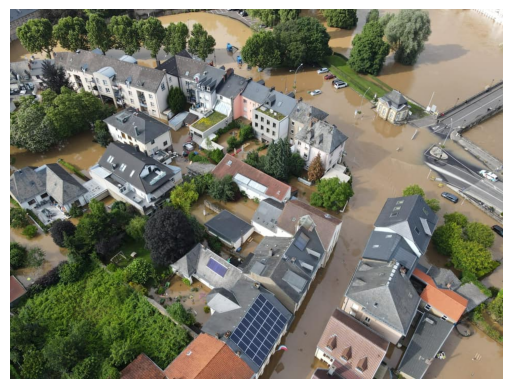

AOI defined using WKT string.


C:\Users\Nicla-WEO\AppData\Local\Temp\ipykernel_31064\2398808351.py:243: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = [aoi_gdf.geometry.centroid.y.mean(
C:\Users\Nicla-WEO\AppData\Local\Temp\ipykernel_31064\2398808351.py:244: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ), aoi_gdf.geometry.centroid.x.mean()]


In [7]:
VISUALIZE_AOI = True

img_path = "sample/Echternach-Luxembourg-July-2021-VilleEchternach_0.jpg"

coarse_target_gps = None #(6.424948437119524, 49.812234179645245) 
target_wkt = "POLYGON ((6.423841 49.811677, 6.425863 49.811677, 6.425863 49.813152, 6.423841 49.813152, 6.423841 49.811677))"

query_img = Image.open(img_path).convert("RGB")
plt.imshow(query_img)
plt.axis('off')  # Hides the axis
plt.show()

if coarse_target_gps is not None:
    buffer_m = 140  # Buffer radius in km
    aoi_p = define_aoi_by_point(coarse_target_gps, buffer_m)
    print(f"AOI for buffer around {coarse_target_gps} defined.")
    if VISUALIZE_AOI:
        map_p = visualize_aoi_and_point(aoi_p, point_coords=coarse_target_gps)
    else:
        map_p = None

elif target_wkt is not None:
    aoi_p = define_aoi_by_wkt(target_wkt)
    print(f"AOI defined using WKT string.")
    if VISUALIZE_AOI:
        map_p = visualize_aoi_and_point(aoi_p)
    else:
        map_p = None

else:
    raise ValueError("Please provide either a GPS coordinate or WKT string.")

map_p



In [8]:
GEOLOCATION_DIR = "data/geolocation"
geo_output_dir = f"{GEOLOCATION_DIR}/{os.path.basename(img_path).split('.')[0]}"

In [9]:
zoom = 20
output_dir = f"{geo_output_dir}/tiles/unflip"
tiles = get_xyz_tiles(aoi_p, zoom)
tile_paths = []
for x, y, z in tqdm(tiles):
    download_quadkey_tile(x, y, z, output_dir, verbose=False)
    tile_paths.append(os.path.join(output_dir, f"{x}_{y}_{z}.tif"))

100%|██████████| 49/49 [00:01<00:00, 24.77it/s]


In [10]:
tile_paths[3]

'data/geolocation/Echternach-Luxembourg-July-2021-VilleEchternach_0/tiles/unflip\\542998_356467_20.tif'

In [12]:
output_dir = f"{geo_output_dir}/merged"
os.makedirs(output_dir, exist_ok = True)
merged_raster_path = os.path.join(output_dir, f"{os.path.basename(img_path).split('.')[0]}_merged.tif")
merge_tiles(tile_paths, merged_raster_path)

Merged tiles saved to: data/geolocation/Echternach-Luxembourg-July-2021-VilleEchternach_0/merged\Echternach-Luxembourg-July-2021-VilleEchternach_0_merged.tif


In [13]:
cropped_raster_path = f"{geo_output_dir}/{os.path.basename(img_path).split('.')[0]}_ref.tif"
crop_raster_to_aoi(merged_raster_path, aoi_p, cropped_raster_path)


Cropped raster saved to: data/geolocation/Echternach-Luxembourg-July-2021-VilleEchternach_0/Echternach-Luxembourg-July-2021-VilleEchternach_0_ref.tif


Image #1 size: heigt=720, width=960


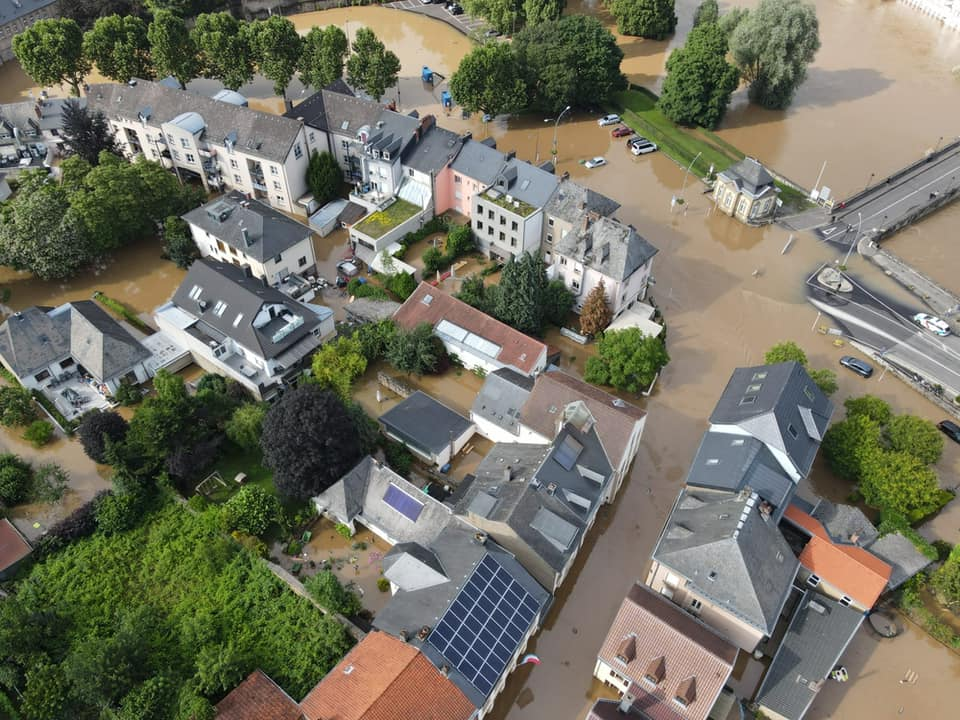


Image #2 size: heigt=1705, width=1508


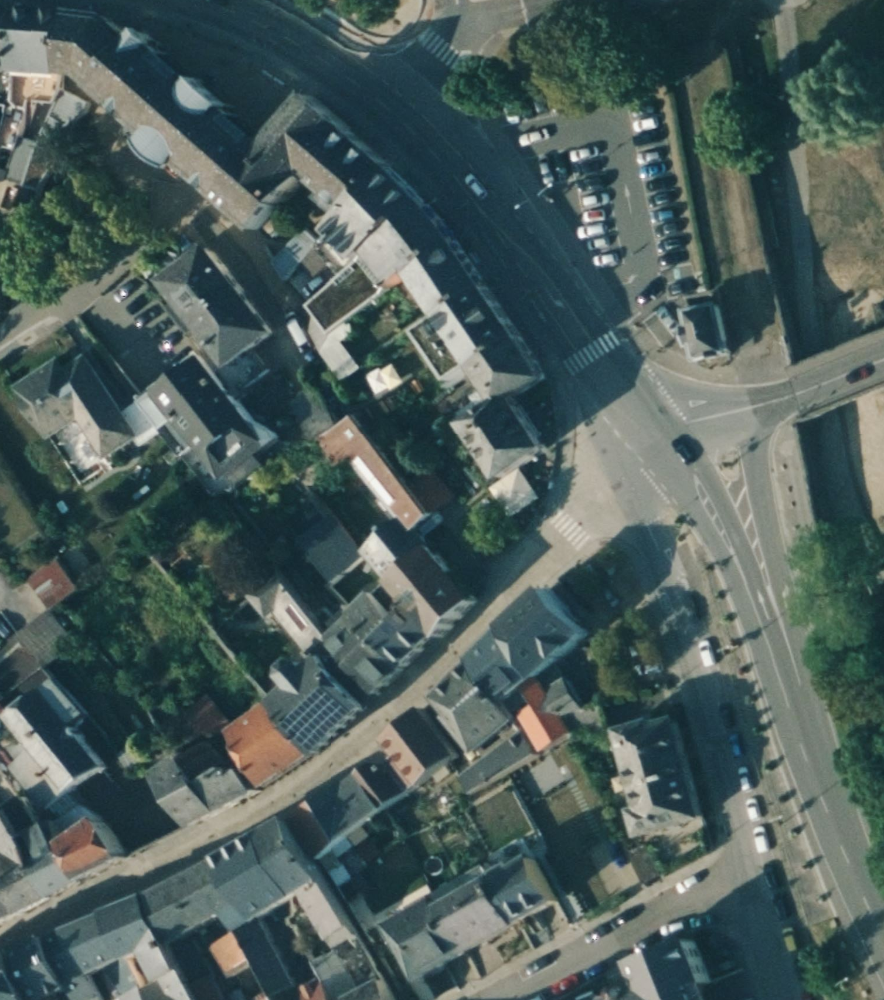

In [14]:
img_path = "sample/Echternach-Luxembourg-July-2021-VilleEchternach_0.jpg"
query_img = Image.open(img_path).convert("RGB")
ref_path = cropped_raster_path 
ref_img = Image.open(ref_path).convert("RGB")

print(f"Image #1 size: heigt={query_img.height}, width={query_img.width}")
display(query_img)

print(f"\nImage #2 size: heigt={ref_img.height}, width={ref_img.width}")
display(ref_img)

# SuperGlue

In [49]:
print(img_path, cropped_raster_path)

sample/Echternach-Luxembourg-July-2021-VilleEchternach_0.jpg data/geolocation/Echternach-Luxembourg-July-2021-VilleEchternach_0_ref.tif


In [ ]:
image_pairs = [
    (img_path, cropped_raster_path),
    # Add more image pairs as needed
]


In [120]:
# Preprocess the image pairs
images, inputs = preprocess_image_pairs(image_pairs, superglue_processor)

# Run the SuperGlue model
outputs = run_superglue_model(superglue_model, inputs)

# Post-process the results
results = postprocess_results(outputs, images, superglue_processor, threshold=0.4)

Visualizing matches for image pair #0
Matches saved to: data/geolocation/Echternach-Luxembourg-July-2021-VilleEchternach_0/Echternach-Luxembourg-July-2021-VilleEchternach_0_superglue_matches.png


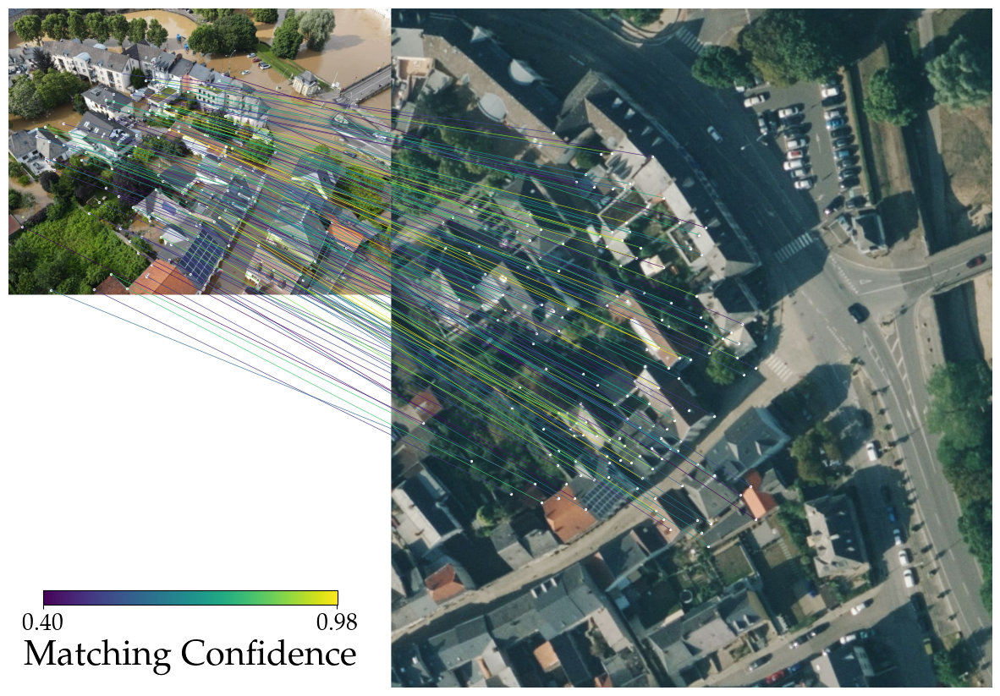

In [ ]:
# Print the results
# print_results(results)

# Visualize the matches for each pair
for i, (query_img, ref_img) in enumerate(images):
    print(f"Visualizing matches for image pair #{i}")
    visualize_matches(query_img, ref_img, [results[i]])

# Homography

In [127]:
# Post-process the results
results = postprocess_results(outputs, images, superglue_processor, threshold=0.4)

Homography matrix computed successfully:
[[ 3.54198527e+00  1.56525348e+00 -3.92783152e+02]
 [ 1.66587812e+00  1.00943215e+01 -1.82697486e+03]
 [ 3.02358401e-04  5.06254634e-03  1.00000000e+00]]


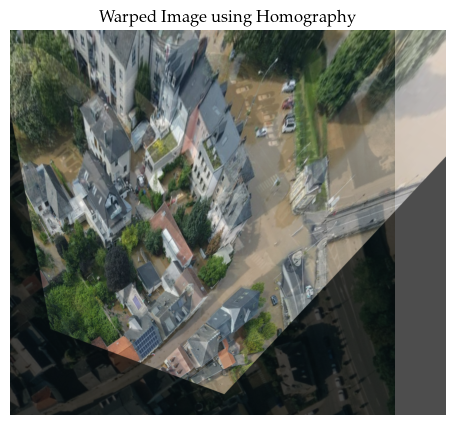

Warped detections saved to: data/geolocation/Echternach-Luxembourg-July-2021-VilleEchternach_0/Echternach-Luxembourg-July-2021-VilleEchternach_0_warped_detections.png


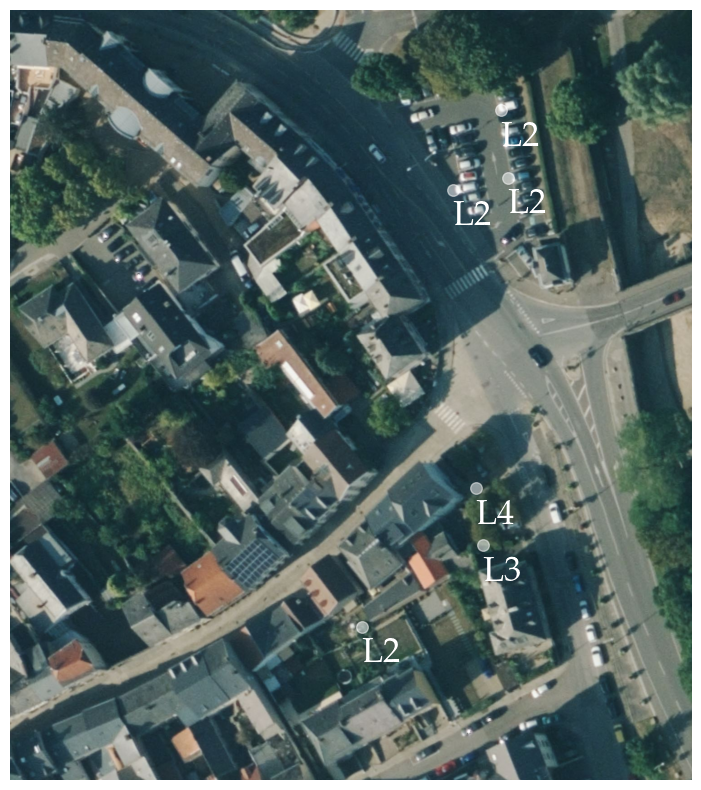

In [ ]:
# Define File Paths
img_path = "sample/Echternach-Luxembourg-July-2021-VilleEchternach_0.jpg"
label_path = r"outputs\article_oblique\levels_yolo_annotations\Echternach-Luxembourg-July-2021-VilleEchternach_0.txt"  # YOLO label file
query_img = Image.open(img_path).convert("RGB")
ref_path = cropped_raster_path
ref_img = Image.open(ref_path).convert("RGB")

# Load YOLO Detections from Label File
yolo_detections = load_yolo_detections(label_path, query_img.width, query_img.height)

# Compute Homography (Assumes SuperGlue was already run)
H, mask = compute_homography([results[0]], images[0][0], images[0][1])

# Warp YOLO Detection Centers
transformed_centers = warp_yolo_detections(yolo_detections, H)

# Visualize Transformed Detections on Reference Image
visualize_transformed_detections(ref_img, transformed_centers, yolo_detections)

In [ ]:
#TODO clean up the code below

import json
import rasterio
from rasterio.transform import xy
from rasterio.warp import transform as warp_transform
import folium
import contextily as ctx

# -------------------------------
# Save Transformed Points as GeoJSON
# -------------------------------
geojson_features = []
world_coords = []

# Open the geotiff with rasterio to get its transform and CRS.
with rasterio.open(ref_path) as src:
    src_crs = src.crs
    transform_affine = src.transform

    for (x, y), (_, _, _, _, class_id) in zip(transformed_centers, yolo_detections):
        # Convert pixel (col, row) to projected coordinates.
        # Note: In rasterio, x corresponds to the column and y to the row.
        proj_x, proj_y = xy(transform_affine, int(y), int(x))
        
        # Reproject the point to EPSG:4326 if the source CRS is different.
        if src_crs.to_string() != "EPSG:4326":
            lon, lat = warp_transform(src_crs, "EPSG:4326", [proj_x], [proj_y])
            lon, lat = lon[0], lat[0]
        else:
            lon, lat = proj_x, proj_y
        
        world_coords.append((lat, lon))  # folium uses (lat, lon)
        
        # Create a GeoJSON feature for the point.
        feature = {
            "type": "Feature",
            "geometry": {
                "type": "Point",
                "coordinates": [lon, lat]
            },
            "properties": {
                "class_id": class_id
            }
        }
        geojson_features.append(feature)

# Build the GeoJSON FeatureCollection.
geojson_dict = {
    "type": "FeatureCollection",
    "features": geojson_features
}

# Save the GeoJSON to a file.
geojson_path = "transformed_points.geojson"
with open(geojson_path, "w") as f:
    json.dump(geojson_dict, f)
print(f"Transformed points saved as GeoJSON: {geojson_path}")

# -------------------------------
# Create and Show an OSM CartoDB Positron Map using folium
# -------------------------------
# If we have any points, compute the center to initialize the map.
if world_coords:
    avg_lat = sum(lat for lat, lon in world_coords) / len(world_coords)
    avg_lon = sum(lon for lat, lon in world_coords) / len(world_coords)
else:
    avg_lat, avg_lon = 0, 0

# Create a folium map with CartoDB Positron tiles.
m = folium.Map(location=[avg_lat, avg_lon], zoom_start=12, tiles="CartoDB positron")

# Add each transformed point as a marker on the map.
for (lat, lon), (_, _, _, _, class_id) in zip(world_coords, yolo_detections):
    folium.CircleMarker(
        location=[lat, lon],
        radius=5,
        popup=f"Level {class_id}",
        color="cadetblue",
        fill=True,
        fill_color="cadetblue"
    ).add_to(m)

# Save the map to an HTML file.
map_path = "detection_map.html"
m.save(map_path)
print(f"Map with transformed points saved as HTML: {map_path}")

# Display the map directly:
m



Transformed points saved as GeoJSON: transformed_points.geojson
Map with transformed points saved as HTML: detection_map.html


In [149]:
ctx.providers.keys()

dict_keys(['OpenStreetMap', 'MapTilesAPI', 'OpenSeaMap', 'OPNVKarte', 'OpenTopoMap', 'OpenRailwayMap', 'OpenFireMap', 'SafeCast', 'Stadia', 'Thunderforest', 'BaseMapDE', 'CyclOSM', 'Jawg', 'MapBox', 'MapTiler', 'TomTom', 'Esri', 'OpenWeatherMap', 'HERE', 'HEREv3', 'FreeMapSK', 'MtbMap', 'CartoDB', 'HikeBike', 'BasemapAT', 'nlmaps', 'NASAGIBS', 'NLS', 'JusticeMap', 'GeoportailFrance', 'OneMapSG', 'USGS', 'WaymarkedTrails', 'OpenAIP', 'OpenSnowMap', 'AzureMaps', 'SwissFederalGeoportal', 'TopPlusOpen', 'Gaode', 'Strava', 'OrdnanceSurvey'])

Static map saved as: static_map.png


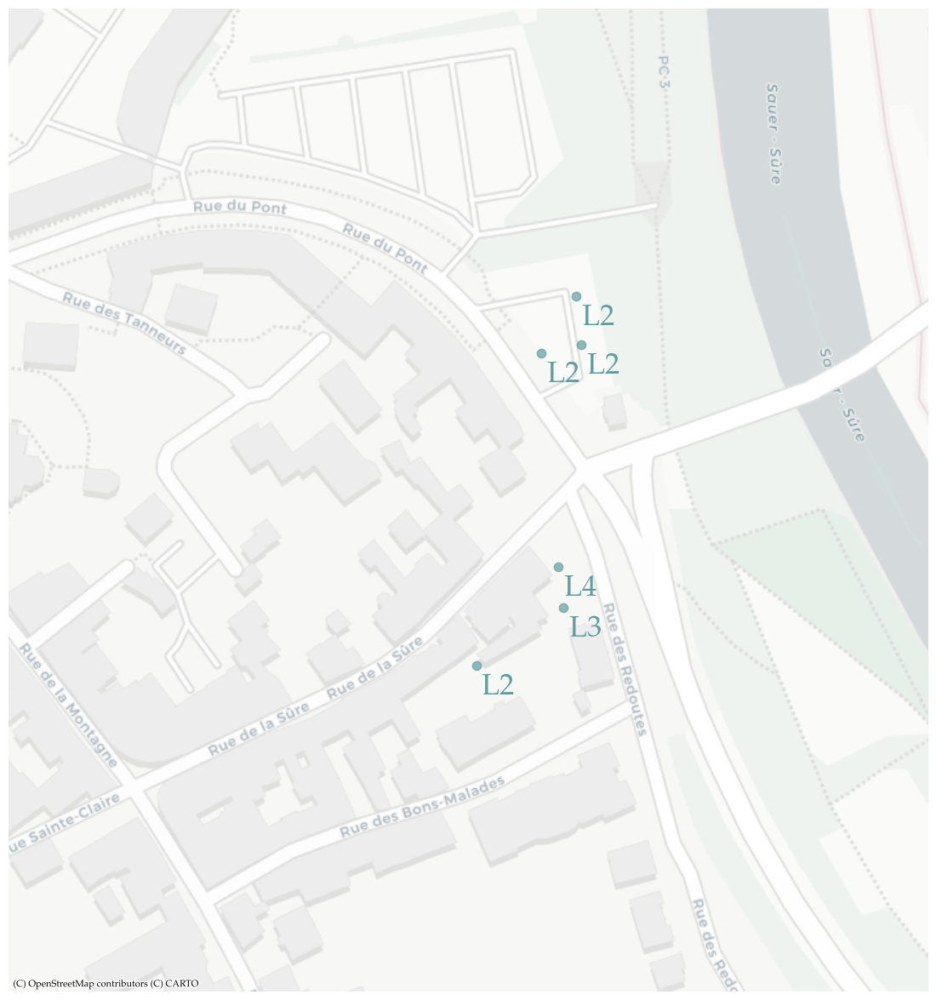

In [169]:
# -------------------------------
# Create a Static Map using contextily and geopandas
# -------------------------------
# Create a GeoDataFrame from the transformed points
gdf = gpd.GeoDataFrame(
    {"class_id": [det[4] for det in yolo_detections]},
    geometry=[Point(lon, lat) for lat, lon in world_coords],
    crs="EPSG:4326"
)

# Reproject to EPSG:3857 (Web Mercator) for static mapping with contextily
gdf = gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(15, 15))
gdf.plot(ax=ax, marker='o', color='cadetblue', markersize=55, alpha=0.7)

for x, y, label in zip(gdf.geometry.x, gdf.geometry.y, gdf.class_id):
    ax.annotate(f"L{label}", xy=(x, y), xytext=(5, -25), textcoords="offset points", fontsize=25, color='cadetblue')

# Optionally adjust the extent based on the points (with some padding)
aoi_mercator = aoi_p.to_crs(epsg=3857)
xmin, ymin, xmax, ymax = aoi_mercator.total_bounds
ax.set_xlim(xmin -100, xmax+100)
ax.set_ylim(ymin-100, ymax+100)

# Add the CartoDB Positron basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)



plt.axis('off')
static_map_path = "static_map.png"
plt.savefig(static_map_path, dpi=300, bbox_inches='tight')
print(f"Static map saved as: {static_map_path}")
plt.show()